#        P-219- Hourly Energy Consumption Forecast 
        The hourly power consumption data comes from PJM's website and are in megawatts (MW).

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
df= pd.read_excel('PJMW_MW_Hourly.xlsx')
df

,Datetime,PJMW_MW
0,2002-12-31 01:00:00,5077
1,2002-12-31 02:00:00,4939
2,2002-12-31 03:00:00,4885
3,2002-12-31 04:00:00,4857
4,2002-12-31 05:00:00,4930
...,...,...
143201,2018-01-01 20:00:00,8401
143202,2018-01-01 21:00:00,8373
143203,2018-01-01 22:00:00,8238
143204,2018-01-01 23:00:00,7958


In [3]:
df.dtypes

Datetime    datetime64[ns]
PJMW_MW              int64
dtype: object

In [4]:
#Arranging data into ascending order

df = df.sort_values(by='Datetime', ascending=True).reset_index(drop=True)
df

,Datetime,PJMW_MW
0,2002-04-01 01:00:00,4374
1,2002-04-01 02:00:00,4306
2,2002-04-01 03:00:00,4322
3,2002-04-01 04:00:00,4359
4,2002-04-01 05:00:00,4436
...,...,...
143201,2018-08-02 20:00:00,6545
143202,2018-08-02 21:00:00,6496
143203,2018-08-02 22:00:00,6325
143204,2018-08-02 23:00:00,5892


In [5]:
df.describe()

,PJMW_MW
count,143206.000000
mean,5602.375089
std,979.142872
min,487.000000
25%,4907.000000
50%,5530.000000
75%,6252.000000
max,9594.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 143206 entries, 0 to 143205
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   Datetime  143206 non-null  datetime64[ns]
 1   PJMW_MW   143206 non-null  int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 2.2 MB


In [7]:
df['Datetime'] = pd.to_datetime(df['Datetime'])

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 143206 entries, 0 to 143205
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   Datetime  143206 non-null  datetime64[ns]
 1   PJMW_MW   143206 non-null  int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 2.2 MB


In [9]:
df[df.duplicated()]

,Datetime,PJMW_MW


In [10]:
df.isna().sum()

Datetime    0
PJMW_MW     0
dtype: int64

In [11]:
df[df['PJMW_MW'] < 500]

,Datetime,PJMW_MW
10148,2003-05-29,487


In [12]:
df2= df['PJMW_MW'] 
df2.head()

0    4374
1    4306
2    4322
3    4359
4    4436
Name: PJMW_MW, dtype: int64

In [13]:
df2.index = df.Datetime

In [14]:
df2.head()

Datetime
2002-04-01 01:00:00    4374
2002-04-01 02:00:00    4306
2002-04-01 03:00:00    4322
2002-04-01 04:00:00    4359
2002-04-01 05:00:00    4436
Name: PJMW_MW, dtype: int64

In [15]:
df2= pd.DataFrame(df2)
df2.head()

,PJMW_MW
Datetime,
2002-04-01 01:00:00,4374
2002-04-01 02:00:00,4306
2002-04-01 03:00:00,4322
2002-04-01 04:00:00,4359
2002-04-01 05:00:00,4436


In [16]:
df["Year"] = df["Datetime"].dt.year
df["Quater"] = df["Datetime"].dt.quarter
df["Month"] = df["Datetime"].dt.month
df["Weeks"] = df["Datetime"].dt.weekofyear
df["Daysofmonth"] = df["Datetime"].dt.day
df["Daysofyear"] = df["Datetime"].dt.dayofyear
df["Hour"] = df["Datetime"].dt.hour
df["Day"] = df["Datetime"].dt.dayofweek
df['date_offset'] = (df.Datetime.dt.month*100 + df.Datetime.dt.day - 320)%1300
df['season'] = pd.cut(df['date_offset'], [0, 300, 602, 900, 1300], 
                      labels=['Spring', 'Summer', 'Fall', 'Winter'])

In [17]:
df.head()

,Datetime,PJMW_MW,Year,Quater,Month,Weeks,Daysofmonth,Daysofyear,Hour,Day,date_offset,season
0,2002-04-01 01:00:00,4374,2002,2,4,14,1,91,1,0,81,Spring
1,2002-04-01 02:00:00,4306,2002,2,4,14,1,91,2,0,81,Spring
2,2002-04-01 03:00:00,4322,2002,2,4,14,1,91,3,0,81,Spring
3,2002-04-01 04:00:00,4359,2002,2,4,14,1,91,4,0,81,Spring
4,2002-04-01 05:00:00,4436,2002,2,4,14,1,91,5,0,81,Spring


In [18]:
df.index=df['Datetime']

In [19]:
df= df.drop(['Datetime'], axis=1)
df.head()

,PJMW_MW,Year,Quater,Month,Weeks,Daysofmonth,Daysofyear,Hour,Day,date_offset,season
Datetime,,,,,,,,,,,
2002-04-01 01:00:00,4374,2002,2,4,14,1,91,1,0,81,Spring
2002-04-01 02:00:00,4306,2002,2,4,14,1,91,2,0,81,Spring
2002-04-01 03:00:00,4322,2002,2,4,14,1,91,3,0,81,Spring
2002-04-01 04:00:00,4359,2002,2,4,14,1,91,4,0,81,Spring
2002-04-01 05:00:00,4436,2002,2,4,14,1,91,5,0,81,Spring


In [20]:
df['Year'].unique()

array([2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012,
       2013, 2014, 2015, 2016, 2017, 2018], dtype=int64)

In [21]:
df['season'].unique()

['Spring', 'Summer', 'Fall', 'Winter', NaN]
Categories (4, object): ['Spring' < 'Summer' < 'Fall' < 'Winter']

In [22]:
df['season'] = df['season'].fillna('Summer')

In [23]:
df['season'].unique()

['Spring', 'Summer', 'Fall', 'Winter']
Categories (4, object): ['Spring' < 'Summer' < 'Fall' < 'Winter']

In [24]:
df['Month'].unique()

array([ 4,  5,  6,  7,  8,  9, 10, 11, 12,  1,  2,  3], dtype=int64)

<AxesSubplot: title={'center': 'PJME Energy Use in MW'}, xlabel='Datetime'>

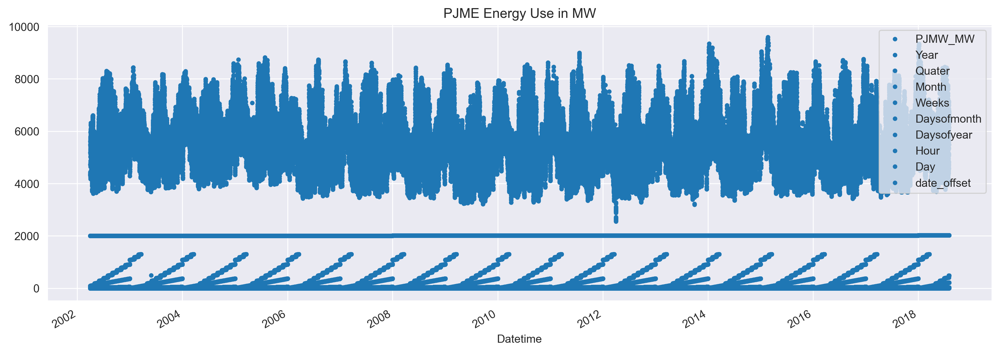

In [25]:
sns.set_style('darkgrid')

color_pal= sns.color_palette()
plt.rcParams['figure.dpi']=300
df.plot(style='.',
        figsize=(15, 5),
        color=color_pal[0],
        title='PJME Energy Use in MW')

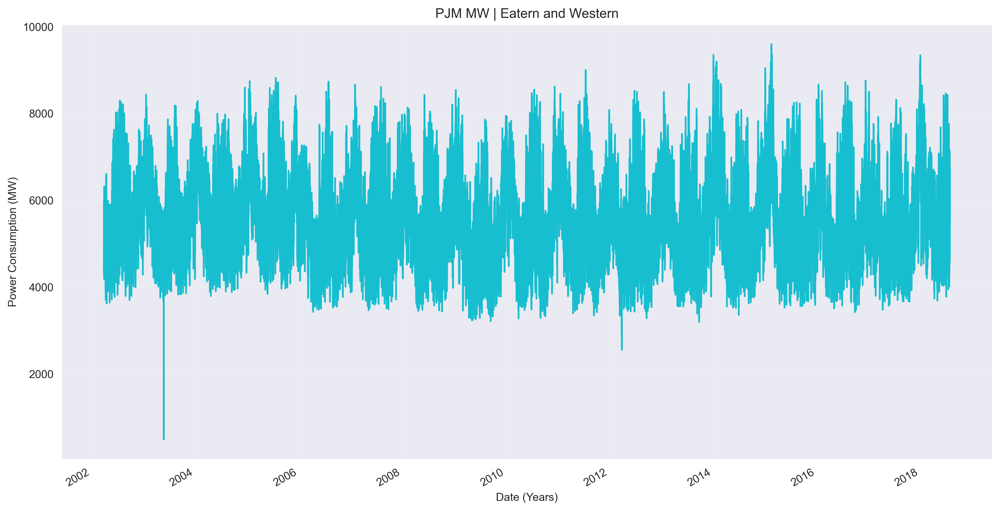

In [26]:
ax = df['PJMW_MW'].plot(figsize=(15, 8),
             color=['C9', 'C3'],
             title='PJM MW | Eatern and Western',
             ylabel='Power Consumption (MW)',
             xlabel='Date (Years)',
             sharex=True,
             sharey=True)
ax.grid(alpha=0.2)
plt.show()

In [27]:
ts_curious = ['Year','Quater','Month','Weeks','Daysofmonth','Daysofyear','Hour','Day','season']
ts_el = len(ts_curious)

In [28]:
fig, ax = plt.subplots(nrows=ts_el, ncols=1, figsize=(20, 10*ts_el))

for i, ts in enumerate(ts_curious):
    sns.boxplot(data=df, x=ts, y='PJMW_MW', ax=ax[i])
    ax[i].set_title(f'PJMW_MW {ts}')
    
plt.tight_layout(pad=0, w_pad=0.5, h_pad=0.5)
plt.show()

# Adding Seasonality

In [29]:
fig, ax = plt.subplots(nrows=ts_el, ncols=1, figsize=(20, 9*ts_el))

for i, ts in enumerate(ts_curious):
    sns.boxplot(data=df, x=ts, y='PJMW_MW', hue='season', ax=ax[i])
    ax[i].set_title(f'PJMW_MW {ts}')
    
plt.tight_layout(pad=0, w_pad=0.5, h_pad=0.5)
plt.show()

<AxesSubplot: xlabel='PJMW_MW', ylabel='Count'>

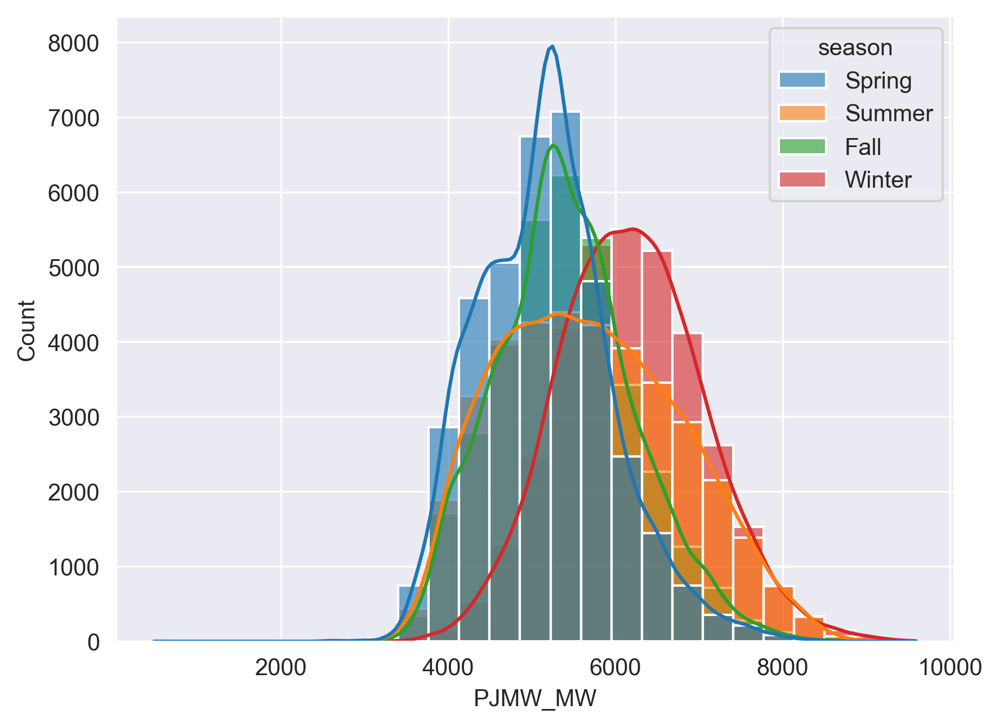

In [30]:
df.index = range(0,len(df))
sns.histplot(x = 'PJMW_MW', 
                 kde=True,
                 bins=25,
                 hue='season',
                 palette='tab10',
                 alpha=0.6,data = df)

In [31]:
df['season'].unique()

['Spring', 'Summer', 'Fall', 'Winter']
Categories (4, object): ['Spring' < 'Summer' < 'Fall' < 'Winter']

In [32]:
df2['time']=df2.index
df2['year']=df2.time.dt.year
date_range = pd.date_range(start = f'{df2.year.min()}-04-01',end = f'{df2.year.max()}-08-02',freq = 'D')
missing_dates = date_range.difference(df2['time'].dt.date)

len(missing_dates)

0

In [33]:
df2['month'] = df2['time'].dt.month
month = sorted(df2.month.unique())

Text(0.5, 1.0, 'Time Series for year 2018')

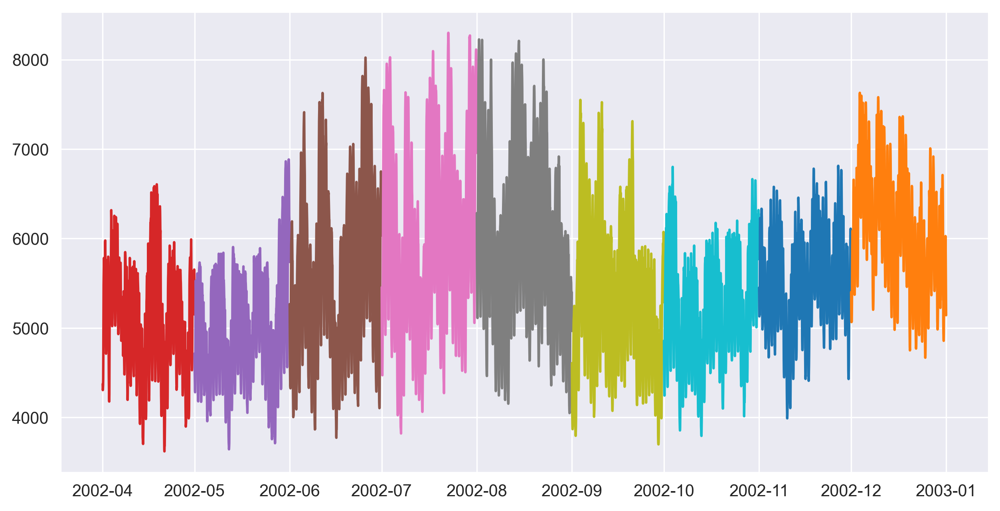

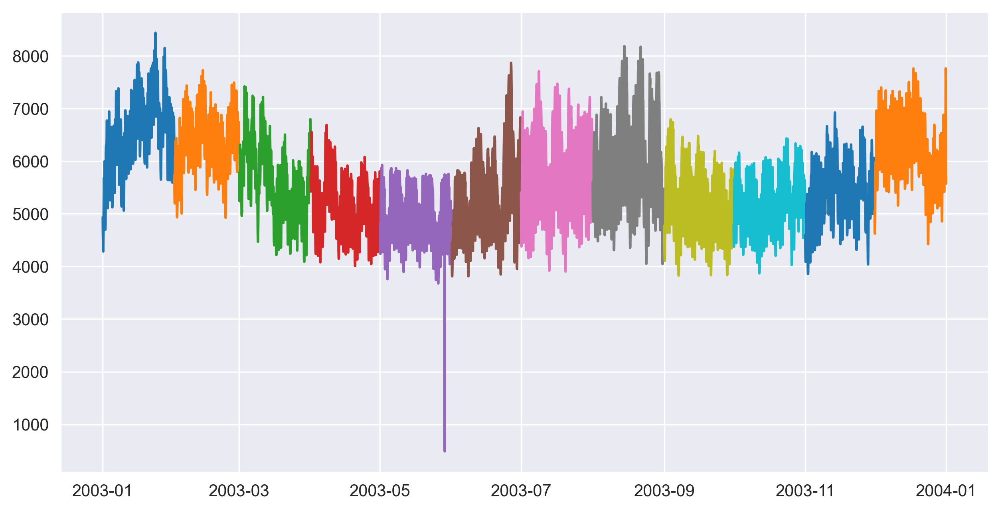

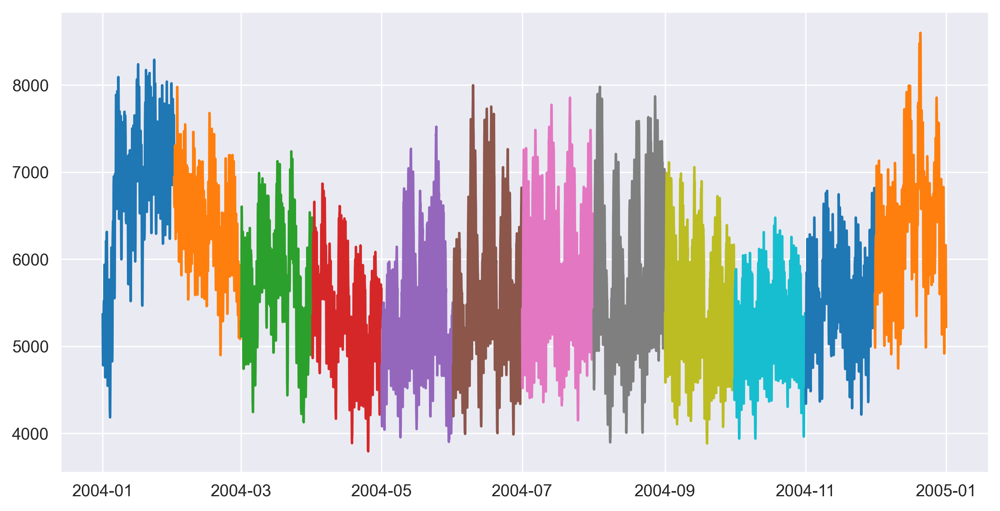

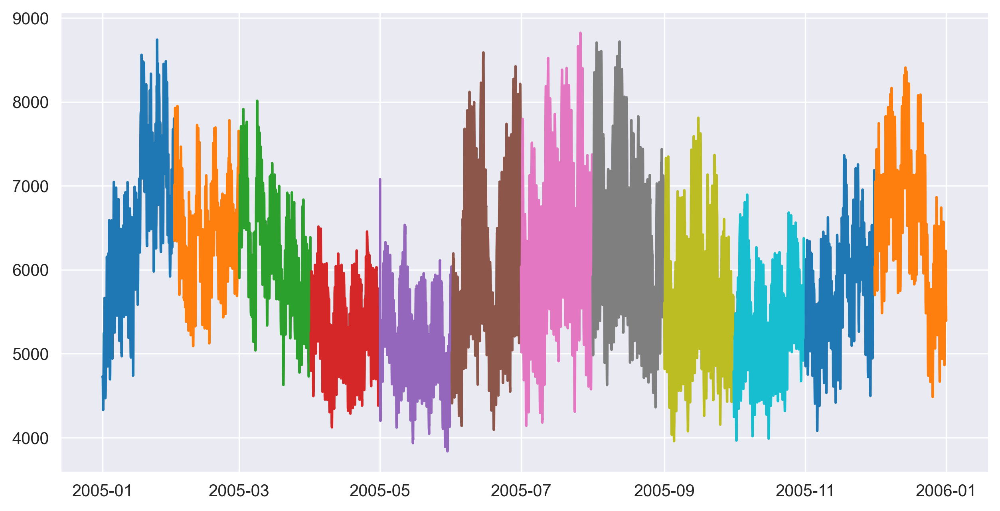

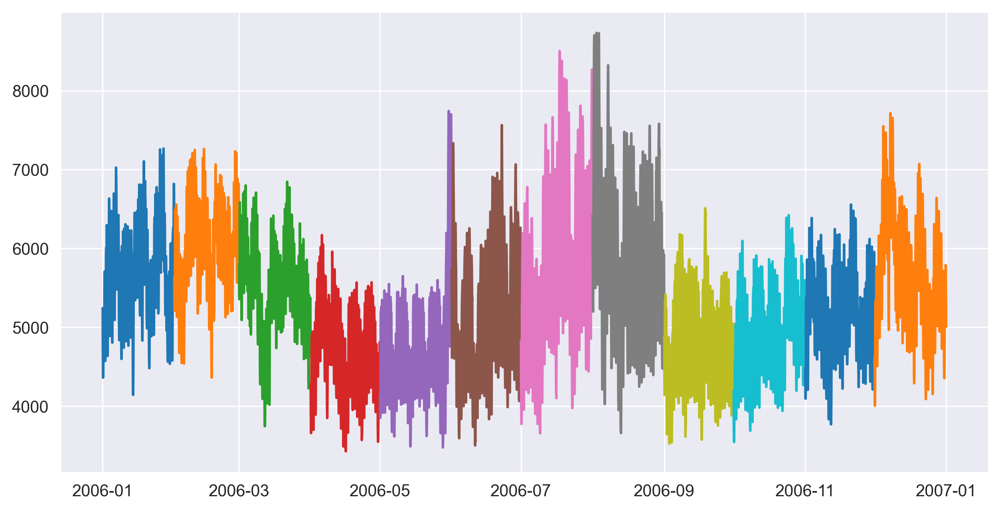

...

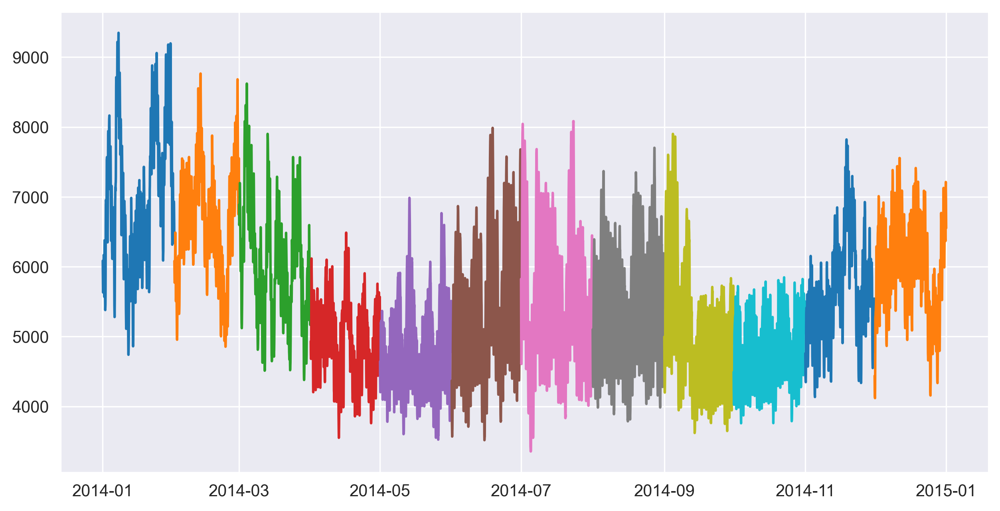

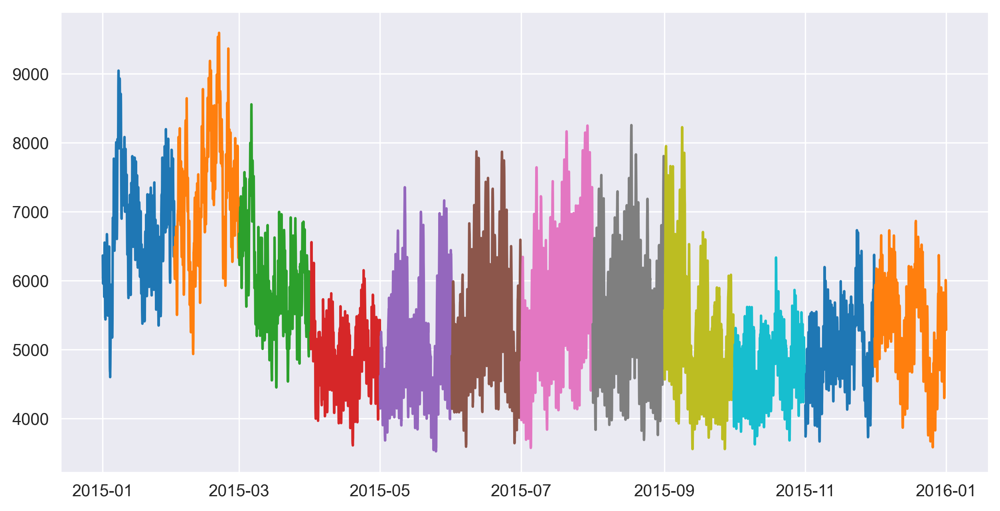

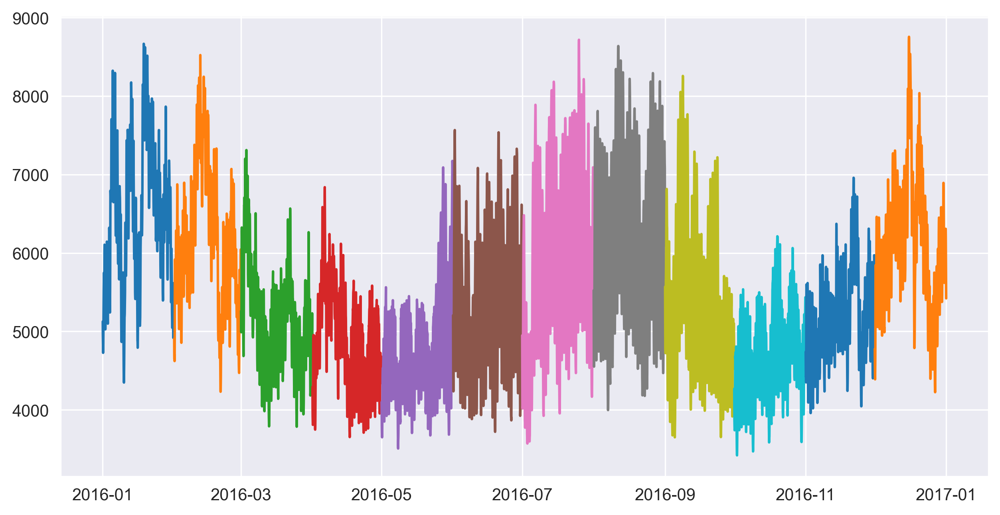

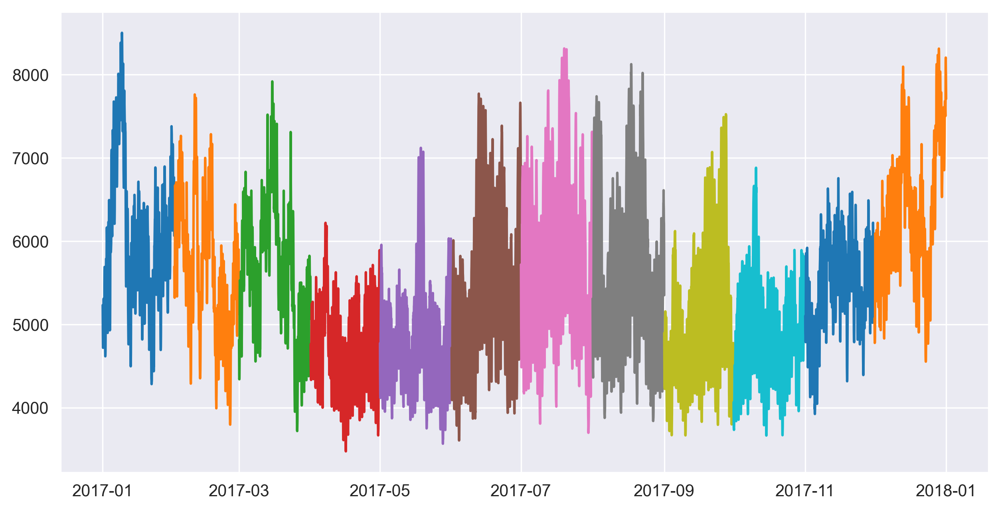

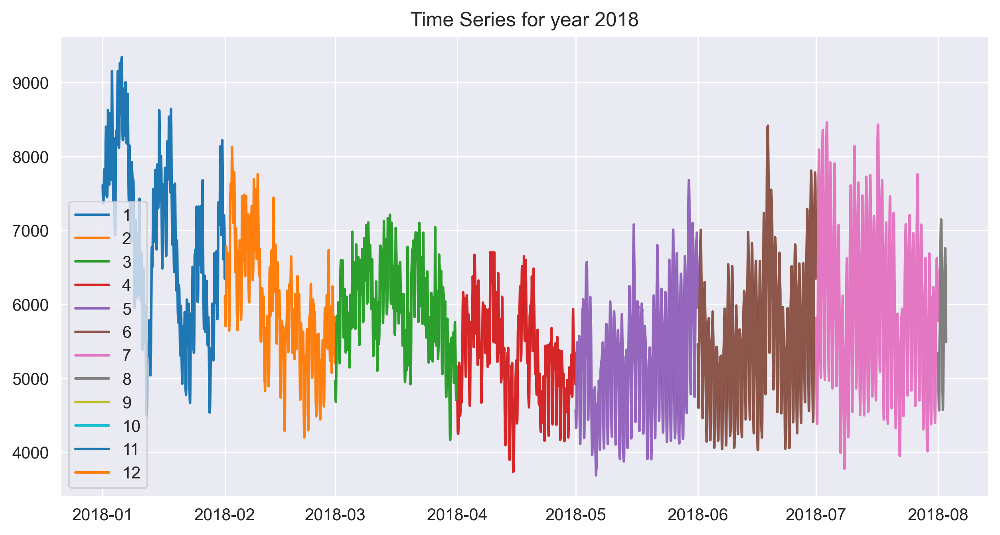

In [34]:
for year in sorted(df2.year.unique()):
    fig, ax = plt.subplots(figsize = (10,5))
    for mon in month:
        mask = (df2.index.year == year) & (df2.index.month == mon)
        month_data = df2.loc[mask]
        ax.plot(month_data.index, month_data['PJMW_MW'],label = mon)
        
ax.legend()
ax.set_title(f'Time Series for year {year}')

<AxesSubplot: xlabel='Datetime', ylabel='PJMW_MW'>

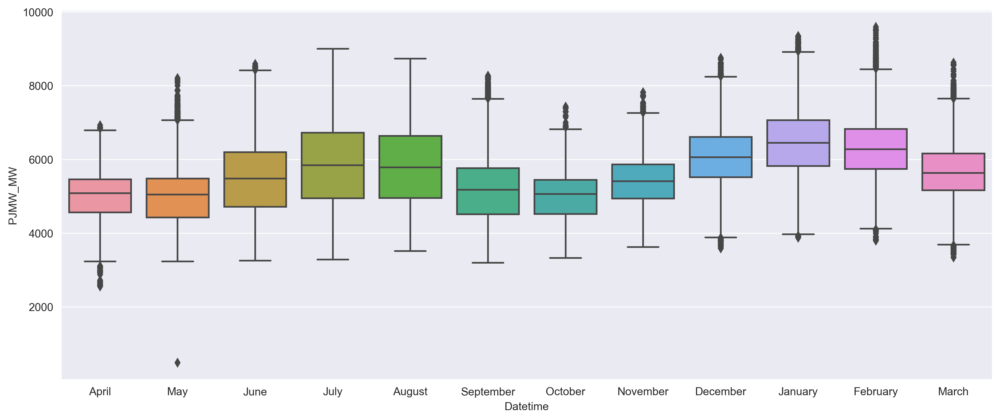

In [35]:
plt.rcParams['figure.figsize']=(15,6)
sns.boxplot(df2.index.month_name(),y=df2['PJMW_MW'])

In [36]:
# Monthly Energy consumption across years
monthly_usage_across_years = pd.pivot_table(df2, values='PJMW_MW', columns=df2.index.month_name(), index=df2.index.year)
monthly_usage_across_years

Datetime,April,August,December,February,January,July,June,March,May,November,October,September
Datetime,,,,,,,,,,,,
2002,5171.318942,6063.909946,6154.673387,NaN,NaN,6097.877688,5685.681944,NaN,5085.094086,5582.980556,5311.936743,5419.641667
2003,5232.509040,6024.669355,6266.799731,6402.547619,6586.263441,5820.044355,5398.618056,5641.485215,5026.915323,5445.623611,5275.403769,5307.640278
2004,5426.936022,5910.219086,6395.706989,6393.234195,6828.658602,5956.732527,5716.779167,5777.657258,5511.560484,5602.116667,5313.002692,5562.062500
2005,5380.983310,6471.497312,6563.709677,6433.568452,6598.818548,6391.413978,6156.520833,6218.537634,5253.323925,5779.622222,5437.663526,5777.605556
2006,4788.084840,6017.083333,5692.561828,6041.986607,5753.059140,5892.213710,5316.781944,5541.309140,4875.614247,5260.411111,5027.837147,4910.723611
2007,5215.961111,6079.646505,6046.346774,6725.876488,6038.096774,5560.966398,5508.394444,5599.539704,5034.049731,5433.479833,5105.029570,5349.212500
2008,4959.263889,5458.784946,6015.278226,6279.462644,6268.275538,5776.416667,5562.731944,5627.838493,4840.682796,5457.931850,4986.365591,5144.813889
2009,4849.751389,5540.622312,6031.521505,6022.083333,6550.642473,5105.278226,5059.287500,5337.670256,4572.251344,4955.984701,4733.576613,4748.466667
2010,4738.938889,5838.908602,6477.201884,6378.889881,6406.479839,6035.850806,5689.716667,5323.368775,4962.254032,5256.499305,4732.794355,5064.072222


In [37]:
# Total monthly energy consumption from 2002-2018 usage 
total_monthly_usage = monthly_usage_across_years.sum(axis=0, skipna=True)
total_monthly_usage

Datetime
April         85380.725210
August        99025.193713
December      97031.454572
February     100765.172157
January      103162.684140
July          99646.130376
June          93784.852778
March         90464.800822
May           85269.377688
November      86457.706132
October       79964.126134
September     83293.952778
dtype: float64

Text(0, 0.5, 'PJMW (in MW)')

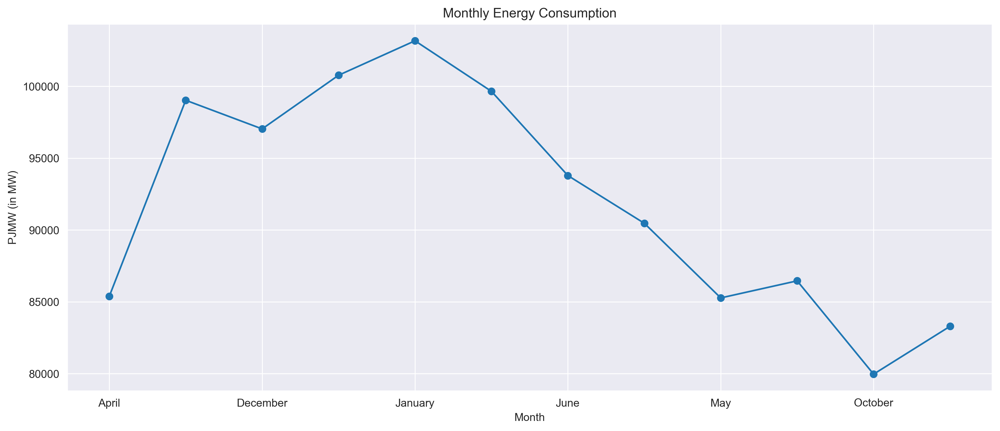

In [38]:
total_monthly_usage.plot(marker='o', title='Monthly Energy Consumption')
plt.xlabel('Month')
plt.ylabel('PJMW (in MW)')

In [39]:
# Quarterly Energy Consumption across years
quarterly_usage_over_years = pd.pivot_table(df, values='PJMW_MW', columns=df['season'], index=df2.index.year)
quarterly_usage_over_years

season,Spring,Summer,Fall,Winter
Datetime,,,,
2002,5227.707518,5946.708333,5617.052459,5779.253788
2003,5181.604440,5757.938158,5593.115691,6283.192884
2004,5547.138197,5820.822368,5667.470726,6438.225926
2005,5540.157227,6284.378947,5900.137237,6428.865169
2006,4998.761214,5676.020614,5277.323185,5746.911517
2007,5196.179348,5691.645175,5492.146136,6172.814052
2008,5126.468297,5511.540351,5390.602810,6100.571098
2009,4815.228261,5180.318421,5105.741452,6084.681030
2010,5020.508152,5727.915789,5369.985005,6181.969555


Text(0, 0.5, 'PJMW (in MW)')

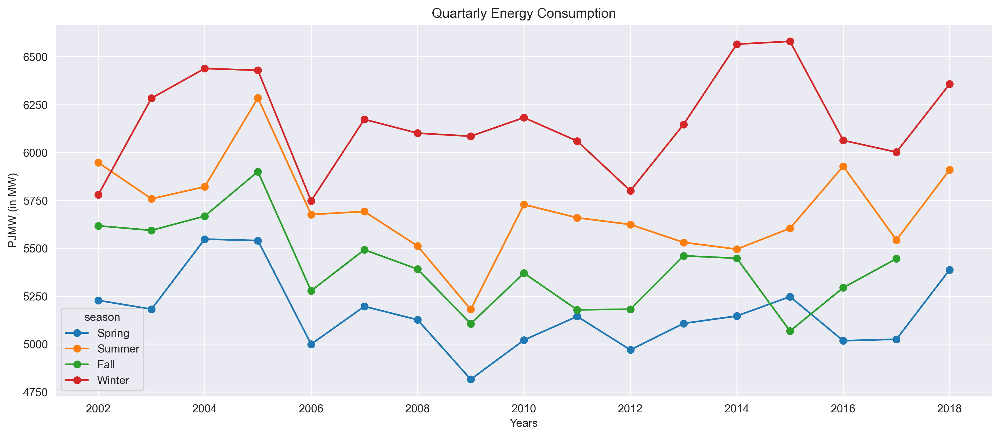

In [40]:
quarterly_usage_over_years.plot(marker='o', title='Quartarly Energy Consumption')
plt.xlabel('Years')
plt.ylabel('PJMW (in MW)')

In [41]:
#Total quarterly Energy consumption over the years
total_quarterly_usage = quarterly_usage_over_years.sum(axis=0, skipna=True)
total_quarterly_usage

season
Spring     87696.922491
Summer     96889.679998
Fall       86487.905635
Winter    104788.920746
dtype: float64

Text(0, 0.5, 'PJMW (in MW)')

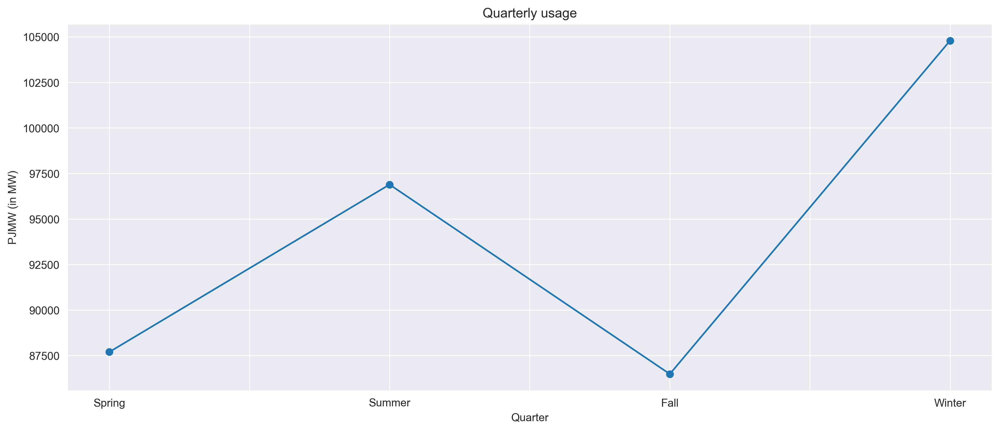

In [42]:
total_quarterly_usage.plot(marker='o', title='Quarterly usage')
plt.xlabel('Quarter')
plt.ylabel('PJMW (in MW)')

In [43]:
#Average Energy Consumption per year
average_year = df2.groupby(df2.index.year)["PJMW_MW"].mean()
average_year

Datetime
2002    5621.663180
2003    5700.628226
2004    5866.616602
2005    6038.406029
2006    5425.448847
2007    5635.396780
2008    5530.132544
2009    5290.557433
2010    5573.025351
2011    5509.640215
2012    5395.010818
2013    5556.783626
2014    5656.334132
2015    5620.985616
2016    5577.929531
2017    5500.184361
2018    5848.157516
Name: PJMW_MW, dtype: float64

Text(0, 0.5, 'PJMW (in MW)')

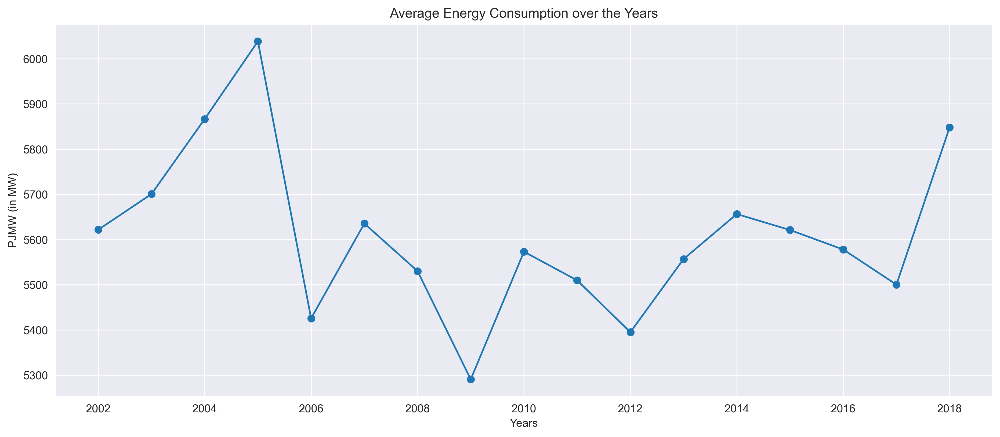

In [44]:
average_year.plot(marker='o', title='Average Energy Consumption over the Years')
plt.xlabel('Years')
plt.ylabel('PJMW (in MW)')

In [45]:
# Average Energy consumption per months
average_month = df2.groupby(df2.index.month_name())["PJMW_MW"].mean()
average_month

Datetime
April        5022.310855
August       5822.142809
December     6064.431236
February     6296.808813
January      6447.667759
July         5861.537081
June         5516.756046
March        5654.097376
May          5015.845746
November     5403.630372
October      4997.642155
September    5205.872049
Name: PJMW_MW, dtype: float64

Text(0, 0.5, 'PJMW (in MW)')

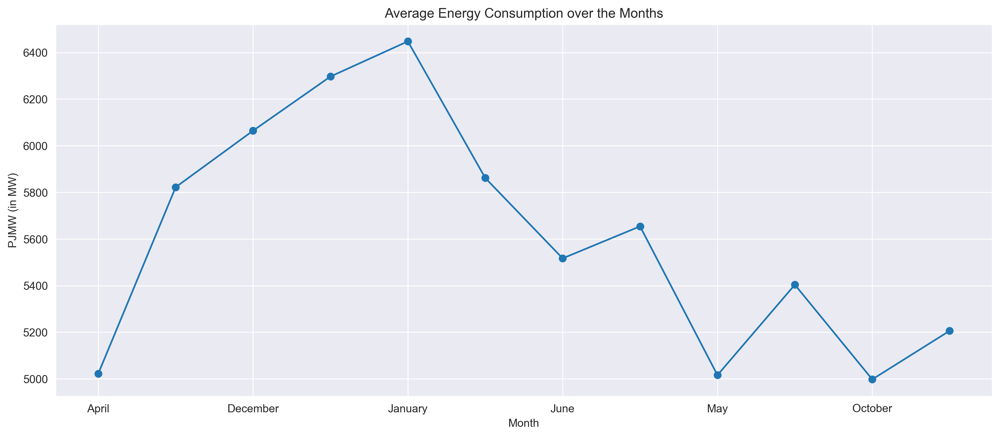

In [46]:
average_month.plot(marker='o', title='Average Energy Consumption over the Months')
plt.xlabel('Month')
plt.ylabel('PJMW (in MW)')

# Seasonal Decomposition

In [47]:
df2=df2.drop(['time','year','month'],axis=1)

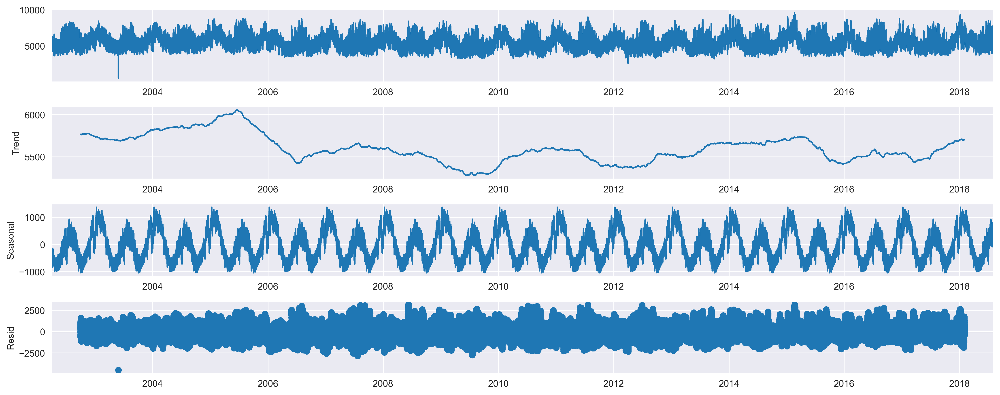

In [65]:
from statsmodels.tsa.seasonal import seasonal_decompose

sd_W = seasonal_decompose(df2, model='additive', period=8760)
sd_W.plot();

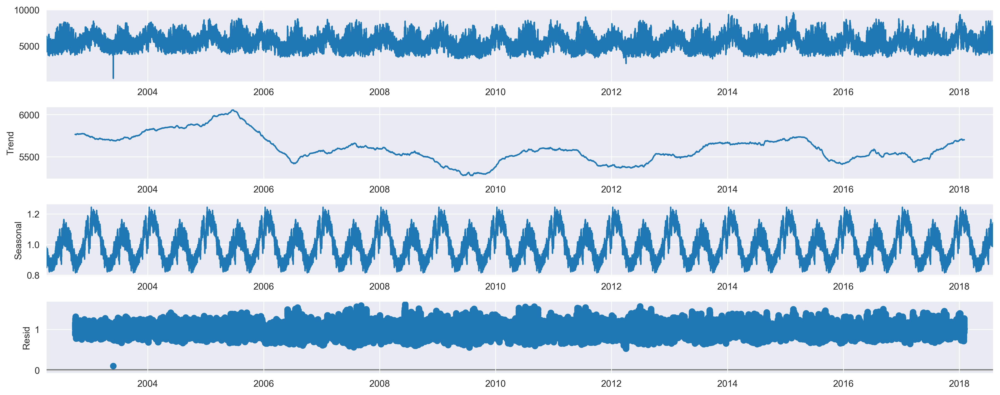

In [66]:
md_W = seasonal_decompose(df2, model='multiplicative', period=8760)
md_W.plot();